In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
!pip install segmentation_models_pytorch

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.8/154.8 kB 5.9 MB/s eta 0:00:00


In [3]:
pip install rasterio

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.3/22.3 MB 73.1 MB/s eta 0:00:00


In [4]:
import os
import cv2
import numpy as np
import rasterio
import glob
import tensorflow as tf
from PIL import Image
import matplotlib.pyplot as plt
import random
import torch

In [5]:
dataset_path_rgn = "drive/MyDrive/Image-results-tiff-of-ragunan"
number_to_load_rgn = ['417708', '417709', '417710', '417711', '417712', '417713', '417714', '417715', '417716', '417717', '417718', '417719']

images_paths = []
masks_paths = []

images_dir = os.path.join(dataset_path_rgn, 'image')
masks_dir = os.path.join(dataset_path_rgn, 'mask')

for numb_name in number_to_load_rgn:
    images_dir = os.path.join(dataset_path_rgn, 'image', numb_name)
    masks_dir = os.path.join(dataset_path_rgn, 'mask', numb_name)
    if os.path.isdir(images_dir) and os.path.isdir(masks_dir):
        image_path = sorted([os.path.join(images_dir, f) for f in os.listdir(images_dir) if f.endswith('.tif')])
        mask_path = sorted([os.path.join(masks_dir, f) for f in os.listdir(masks_dir) if f.endswith('.tif')])

        images_paths.extend(image_path)
        masks_paths.extend(mask_path)

In [6]:
from sklearn.model_selection import train_test_split

image_train, image_test, mask_train, mask_test = train_test_split(
    images_paths, masks_paths, test_size = 0.2, random_state = 84
)

image_test, image_val, mask_test, mask_val = train_test_split(
    image_test, mask_test, test_size = 0.5, random_state = 84
)

In [7]:
from torch.utils.data import Dataset, DataLoader
import albumentations as A
from albumentations.pytorch import ToTensorV2

train_transform = A.Compose([
    A.HorizontalFlip(p = 0.5),
    A.VerticalFlip(p = 0.5),
    A.RandomRotate90(p = 0.5),
    A.RandomBrightnessContrast(p = 0.5),
    A.MedianBlur(blur_limit = 5, p = 0.5),
    A.GaussNoise(std_range = (0.01, 0.05), p = 0.5),
    A.Normalize(mean = (0.485, 0.456, 0.406), std = (0.229, 0.224, 0.225)),
    ToTensorV2()
])

test_transform = A.Compose([
    A.Normalize(mean = (0.485, 0.456, 0.406), std = (0.229, 0.224, 0.225)),
    ToTensorV2()
])

val_transform = A.Compose([
    A.Normalize(mean = (0.485, 0.456, 0.406), std = (0.229, 0.224, 0.225)),
    ToTensorV2()
])

class SegmentDataset(Dataset):
    def __init__(self, image_paths, mask_paths, transform = None):
        self.image_paths = image_paths
        self.mask_paths = mask_paths
        self.transform = transform

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        image_path = self.image_paths[idx]
        mask_path = self.mask_paths[idx]

        image = np.array(Image.open(image_path).convert("RGB"))
        mask = np.array(Image.open(mask_path).convert("L"))

        mask = (mask > 0).astype(np.uint8)

        if self.transform:
            augmented = self.transform(image = image, mask = mask)
            image, mask = augmented["image"], augmented["mask"]

        return image, mask, image_path, mask_path

In [8]:
train_dataset = SegmentDataset(image_train, mask_train, transform = train_transform)
train_loader = DataLoader(train_dataset, batch_size = 8, pin_memory = False, shuffle = True, num_workers = 8)

test_dataset = SegmentDataset(image_test, mask_test, transform = test_transform)
test_loader = DataLoader(test_dataset, batch_size = 8, pin_memory = False, shuffle = False, num_workers = 8)

val_dataset = SegmentDataset(image_val, mask_val, transform = val_transform)
val_loader = DataLoader(val_dataset, batch_size = 8, pin_memory = False, shuffle = False, num_workers = 8)

/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:627: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


In [9]:
train_size = len(train_dataset)
val_size = len(val_dataset)
test_size = len(test_dataset)

print(f"Train size: {train_size}")
print(f"Validation size: {val_size}")
print(f"Test size: {test_size}")

Train size: 144
Validation size: 18
Test size: 18


In [10]:
image_train, mask_train, img_path_train, mask_path_train = train_dataset[0]
print(image_train)
print(image_train.shape)

tensor([[[-1.8782, -1.5357, -1.6042,  ..., -0.5596, -0.6109, -0.6281],
         [-1.5699, -1.6898, -1.6384,  ..., -0.5767, -0.5938, -0.5938],
         [-1.4329, -1.9295, -1.7412,  ..., -0.5938, -0.5596, -0.5424],
         ...,
         [-1.1075, -1.2103, -1.4500,  ..., -0.4054, -0.0801, -0.4226],
         [-1.2788, -1.3644, -1.3987,  ..., -0.0287,  0.3138,  0.3309],
         [-1.7583, -1.8610, -1.7412,  ..., -0.0629,  0.0398,  0.1254]],

        [[-1.5105, -1.1604, -1.2304,  ..., -0.7577, -0.7577, -0.7752],
         [-1.1954, -1.3179, -1.2654,  ..., -0.7752, -0.7402, -0.7402],
         [-1.0553, -1.5630, -1.3704,  ..., -0.7927, -0.7577, -0.7402],
         ...,
         [-0.7752, -0.8803, -1.1253,  ..., -0.2500,  0.0826, -0.2675],
         [-0.9503, -1.0378, -1.0728,  ...,  0.1352,  0.4853,  0.5028],
         [-1.4405, -1.5455, -1.4230,  ...,  0.1001,  0.2052,  0.2927]],

        [[-1.4733, -1.1247, -1.1944,  ..., -0.6018, -0.6193, -0.6367],
         [-1.1596, -1.2816, -1.2293,  ..., -0

In [11]:
print(mask_train)
print(mask_train.shape)

tensor([[1, 1, 1,  ..., 0, 0, 0],
        [1, 1, 1,  ..., 0, 0, 0],
        [1, 1, 1,  ..., 0, 0, 0],
        ...,
        [1, 1, 1,  ..., 0, 0, 0],
        [1, 1, 1,  ..., 0, 0, 0],
        [0, 0, 0,  ..., 0, 0, 0]], dtype=torch.uint8)
torch.Size([256, 256])


In [12]:
image_test, mask_test, img_path_test, mask_path_test = test_dataset[0]
print(image_test)
print(image_test.shape)

tensor([[[-1.3473, -1.4500, -1.4672,  ..., -0.5596, -0.2856, -1.2788],
         [-1.0390, -1.1418, -1.2103,  ..., -0.8507, -0.9192, -1.4158],
         [-0.9192, -0.9877, -1.0733,  ..., -1.5014, -1.3815, -1.0562],
         ...,
         [ 0.8789,  0.8961,  0.9303,  ..., -0.9363, -0.9705, -1.5699],
         [ 0.8789,  0.8961,  0.9132,  ..., -1.6384, -1.6555, -1.5185],
         [ 0.8618,  0.8789,  0.8961,  ..., -1.7412, -1.9809, -1.6555]],

        [[-1.1954, -1.3004, -1.3179,  ..., -0.4076, -0.0924, -1.1078],
         [-0.8803, -0.9853, -1.0553,  ..., -0.6527, -0.7402, -1.2129],
         [-0.7402, -0.8102, -0.8978,  ..., -1.3004, -1.1779, -0.7927],
         ...,
         [ 1.0280,  1.0455,  1.0805,  ..., -0.6877, -0.7227, -1.3354],
         [ 1.0280,  1.0455,  1.0630,  ..., -1.4055, -1.4405, -1.3004],
         [ 1.0105,  1.0280,  1.0455,  ..., -1.5105, -1.7731, -1.4405]],

        [[-1.1596, -1.2641, -1.2816,  ..., -0.2358,  0.1128, -0.8981],
         [-0.8458, -0.9504, -1.0201,  ..., -0

In [13]:
print(mask_test)
print(mask_test.shape)

tensor([[1, 1, 1,  ..., 0, 0, 0],
        [1, 1, 1,  ..., 0, 0, 0],
        [1, 1, 1,  ..., 0, 0, 0],
        ...,
        [0, 0, 0,  ..., 0, 0, 0],
        [0, 0, 0,  ..., 0, 0, 0],
        [0, 0, 0,  ..., 0, 0, 0]], dtype=torch.uint8)
torch.Size([256, 256])


In [14]:
image_val, mask_val, img_path_val, mask_path_val = val_dataset[0]
print(image_val)
print(image_val.shape)

tensor([[[-0.8507, -1.0390, -1.1247,  ..., -1.4672, -1.2788, -1.2617],
         [-1.0733, -0.9192, -1.3130,  ..., -1.5014, -1.4500, -1.5357],
         [-1.0390, -0.6965, -1.1589,  ..., -1.3473, -1.3987, -1.5014],
         ...,
         [-1.3644, -1.3473, -1.3644,  ..., -0.9705, -0.6965, -0.9363],
         [-1.3987, -1.3644, -1.3644,  ..., -0.5253, -0.6452, -0.7993],
         [-1.4158, -1.3815, -1.3644,  ..., -0.9534, -0.6281, -0.5767]],

        [[-0.5126, -0.7052, -0.8102,  ..., -1.0028, -0.8102, -0.7927],
         [-0.7402, -0.5826, -1.0028,  ..., -1.0378, -0.9853, -1.0728],
         [-0.7052, -0.3550, -0.8277,  ..., -0.8803, -0.9328, -1.0378],
         ...,
         [-0.9153, -0.8978, -0.9153,  ..., -0.5301, -0.3375, -0.5826],
         [-0.9503, -0.9153, -0.9153,  ..., -0.0749, -0.2850, -0.4426],
         [-0.9678, -0.9328, -0.9153,  ..., -0.5126, -0.2675, -0.2150]],

        [[-0.4624, -0.6541, -0.7936,  ..., -0.8981, -0.7064, -0.6890],
         [-0.6890, -0.5321, -0.9853,  ..., -0

In [15]:
print(mask_val)
print(mask_val.shape)

tensor([[0, 1, 1,  ..., 1, 1, 1],
        [1, 1, 1,  ..., 1, 1, 1],
        [1, 0, 1,  ..., 1, 1, 1],
        ...,
        [1, 1, 1,  ..., 1, 1, 1],
        [1, 1, 1,  ..., 1, 1, 1],
        [1, 1, 1,  ..., 1, 1, 1]], dtype=torch.uint8)
torch.Size([256, 256])


In [16]:
for i, (image, mask, img_path, mask_path) in enumerate(train_dataset):
    if mask.sum() == 0:
        print(f"Empty mask found at index {i}")

Empty mask found at index 38


In [17]:
for i, (image, mask, img_path, mask_path) in enumerate(test_dataset):
    if mask.sum() == 0:
        print(f"Empty mask found at index {i}")

In [18]:
for i, (image, mask, img_path, mask_path) in enumerate(val_dataset):
    if mask.sum() == 0:
        print(f"Empty mask found at index {i}")

In [19]:
for img_path, mask_path in zip(images_paths[:5], masks_paths[:5]):
    print(f"Image: {os.path.basename(img_path)} - Mask: {os.path.basename(mask_path)}")

Image: 271333.tif - Mask: 271333_mask.tif
Image: 271334.tif - Mask: 271334_mask.tif
Image: 271335.tif - Mask: 271335_mask.tif
Image: 271336.tif - Mask: 271336_mask.tif
Image: 271337.tif - Mask: 271337_mask.tif


In [20]:
for image, mask, img_path, mask_path in train_loader:
    print("image shape:", image.shape)
    print("mask shape:", mask.shape)

image shape: torch.Size([8, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([8, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([8, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([8, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([8, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([8, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([8, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([8, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([8, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([8, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([8, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([8, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([8, 3, 256, 256]

In [21]:
for image, mask, img_path, mask_path in test_loader:
    print("image shape:", image.shape)
    print("mask shape:", mask.shape)

image shape: torch.Size([8, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([8, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([2, 3, 256, 256])
mask shape: torch.Size([2, 256, 256])


In [22]:
for img, mask, img_path, mask_path in val_loader:
    print("image shape:", image.shape)
    print("mask shape:", mask.shape)

image shape: torch.Size([2, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([2, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([2, 3, 256, 256])
mask shape: torch.Size([2, 256, 256])


In [23]:
import segmentation_models_pytorch as smp
import torch.nn as nn
import torch.nn.functional as F

class ChannelSELayer(nn.Module):
    def __init__(self, num_channels, reduction_ratio = 16):
        super(ChannelSELayer, self).__init__()
        num_channels_reduced = max(1, num_channels // reduction_ratio)
        self.fc1 = nn.Linear(num_channels, num_channels_reduced, bias = True)
        self.fc2 = nn.Linear(num_channels_reduced, num_channels, bias = True)
        self.relu = nn.ReLU()
        self.sigmoid = nn.Sigmoid()

    def forward(self, input_tensor):
        batch_size, num_channels, H, W = input_tensor.size()

        squeeze_tensor = input_tensor.view(batch_size, num_channels, -1).mean(dim = 2)

        fc_out_1 = self.relu(self.fc1(squeeze_tensor))
        fc_out_2 = self.sigmoid(self.fc2(fc_out_1))

        return input_tensor * fc_out_2.view(batch_size, num_channels, 1, 1)

class CustomDeepLabV3Plus(nn.Module):
    def __init__(self, encoder_name = "resnet101", encoder_weights = "imagenet", in_channels = 3, classes = 1):
        super(CustomDeepLabV3Plus, self).__init__()
        self.base_model = smp.DeepLabV3Plus(
            encoder_name = encoder_name,
            encoder_weights = encoder_weights,
            in_channels = in_channels,
            classes = 256,
            activation = None
        )

        self.head = nn.Sequential(
            nn.Conv2d(256, 128, 3, padding = 1),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace = True),
            ChannelSELayer(128),
            nn.Dropout2d(0.5),
            nn.Conv2d(128, 64, 3, padding = 1),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace = True),
            ChannelSELayer(64),
            nn.Dropout2d(0.5),
            nn.Conv2d(64, classes, 1)
        )

    def forward(self, x):
        x = self.base_model(x)
        x = self.head(x)
        return x

def batchnorm_to_groupnorm(model, num_groups = 32):
    for name, module in model.named_children():
        if isinstance(module, nn.BatchNorm2d):
            num_features = module.num_features
            valid_num_groups = min(num_groups, num_features)
            while num_features % valid_num_groups != 0 and valid_num_groups > 1:
                valid_num_groups -= 1
            setattr(model, name, nn.GroupNorm(num_groups = valid_num_groups, num_channels = num_features))
        else:
            batchnorm_to_groupnorm(module, num_groups)
    return model

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

deeplab_model = CustomDeepLabV3Plus(
    encoder_name = "resnet101",
    encoder_weights = "imagenet",
    in_channels = 3,
    classes = 1
)

deeplab_model = batchnorm_to_groupnorm(deeplab_model)
deeplab_model.to(device)

/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/156 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/179M [00:00<?, ?B/s]

CustomDeepLabV3Plus(
  (base_model): DeepLabV3Plus(
    (encoder): ResNetEncoder(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): GroupNorm(32, 64, eps=1e-05, affine=True)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): GroupNorm(32, 64, eps=1e-05, affine=True)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): GroupNorm(32, 64, eps=1e-05, affine=True)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): GroupNorm(32, 256, eps=1e-05, affine=True)
          (relu): ReLU(inplace=True)
          (downsample): Sequential(
            (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
  

In [24]:
def calc_iou(pred, gt):
    with torch.no_grad():
        pred = (pred.sigmoid() > 0.5).long()
        pred, gt = pred.contiguous().view(-1), gt.contiguous().view(-1)

        if gt.sum() == 0:
          if pred.sum() == 0:
            return 1.0
          else:
            return 0.0

        intersect = torch.logical_and(pred > 0, gt > 0).sum().float().item()
        union = torch.logical_or(pred > 0, gt > 0).sum().float().item()

        iou = (intersect + 1e-6) / (union + 1e-6)

    return iou

In [25]:
class DiceFocalLoss(nn.Module):
    def __init__(self, dice_weight, focal_weight, alpha = 0.25, gamma = 2.0):
        super(DiceFocalLoss, self).__init__()
        self.alpha = alpha
        self.gamma = gamma
        self.dice_weight = dice_weight
        self.focal_weight = focal_weight

    def forward(self, inputs, targets, smooth = 1e-6):
        inputs = torch.sigmoid(inputs)

        inputs = inputs.view(-1)
        targets = targets.view(-1)

        intersection = (inputs * targets).sum()
        dice_loss = 1 - (2.0 * intersection + smooth) / (inputs.sum() + targets.sum() + smooth)

        bce = F.binary_cross_entropy(inputs, targets, reduction = 'none')
        pt = torch.exp(-bce)
        focal_loss = (self.alpha * (1 - pt) ** self.gamma * bce).mean()

        loss = self.dice_weight * dice_loss + self.focal_weight * focal_loss
        return loss

In [26]:
!pip install optuna

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 404.7/404.7 kB 12.9 MB/s eta 0:00:00


In [40]:
import torch.optim as optim
from tqdm import tqdm
import optuna
import warnings
from torch.optim.lr_scheduler import ReduceLROnPlateau, StepLR, CosineAnnealingLR

device = "cuda" if torch.cuda.is_available() else "cpu"

warnings.filterwarnings("ignore")

def train_model(model, train_loader, val_loader, device, scheduler_type, dice_weight, focal_weight):
    loss_func = DiceFocalLoss(dice_weight = dice_weight, focal_weight = focal_weight)
    optimizer = optim.Adam(model.parameters(), lr = 0.0001)

    num_epoch = 25

    if scheduler_type == "steplr":
        scheduler = StepLR(optimizer, step_size = 5, gamma = 0.5)
    elif scheduler_type == "reducelr":
        scheduler = ReduceLROnPlateau(optimizer, mode = 'min', factor = 0.5, patience = 5)
    else:
        scheduler = CosineAnnealingLR(optimizer, T_max = num_epoch)

    patience = 10
    trigger = 0
    best_val_loss = float('inf')
    best_model = None

    for epoch in range(num_epoch):
        model.train()
        total_loss = 0
        total_iou = 0

        for images, masks, images_path, masks_path in tqdm(train_loader):
            images, masks = images.to(device), masks.to(device)
            optimizer.zero_grad()

            outputs = model(images)
            loss = loss_func(outputs, masks.float())
            loss.backward()
            optimizer.step()

            total_loss += loss.item()
            total_iou += calc_iou(outputs, masks)

        avg_loss = total_loss / len(train_loader)
        avg_iou = total_iou / len(train_loader)

        print(f"Epoch {epoch+1}/{num_epoch}:")
        print(f"Train loss: {avg_loss}, Train Avg IoU: {avg_iou}\n")

        model.eval()
        val_loss = 0
        val_total_iou = 0

        with torch.no_grad():
            for val_images, val_masks, val_images_path, val_masks_path in tqdm(val_loader):
                val_images, val_masks = val_images.to(device), val_masks.to(device)
                val_output = model(val_images)
                val_loss += loss_func(val_output, val_masks.float()).item()

                val_batch_iou = calc_iou(val_output, val_masks)
                val_total_iou += val_batch_iou

        val_avg_loss = val_loss / len(val_loader)
        val_avg_iou = val_total_iou / len(val_loader)

        if isinstance(scheduler, ReduceLROnPlateau):
            scheduler.step(val_avg_loss)
        else:
            scheduler.step()

        print(f"Val loss: {val_avg_loss}, Val Avg IoU: {val_avg_iou}\n")

        if val_avg_loss < best_val_loss:
            best_val_loss = val_avg_loss
            best_model = model
            trigger = 0
        else:
            trigger += 1

        if trigger >= patience:
            print(f"Stop at epoch {epoch+1}")
            break

    return best_model, best_val_loss

In [41]:
import gc

fine_tune_model = None

def objective(trial):
    global fine_tune_model
    torch.cuda.empty_cache()
    gc.collect()

    scheduler = trial.suggest_categorical("scheduler", ["steplr", "reducelr", "cosine"])
    dice_weight, focal_weight = trial.suggest_categorical("loss_weight", [(1.0, 0.0), (0.7, 0.3), (0.5, 0.5), (0.3, 0.7), (0.1, 0.9), (0.0, 1.0)])

    print(f"====================================================")
    print(f"Trial {trial.number}: scheduler = {scheduler}, dice weight = {dice_weight}, focal weight = {focal_weight}\n")

    deeplab_model = CustomDeepLabV3Plus(
        encoder_name = "resnet101",
        encoder_weights = "imagenet",
        in_channels = 3,
        classes = 1
    )

    deeplab_model = batchnorm_to_groupnorm(deeplab_model)
    deeplab_model.to(device)

    model, val_loss = train_model(
        model = deeplab_model,
        train_loader = train_loader,
        val_loader = val_loader,
        device = device,
        scheduler_type = scheduler,
        dice_weight = dice_weight,
        focal_weight = focal_weight
    )

    if not hasattr(objective, "best_loss") or val_loss < objective.best_loss:
        objective.best_loss = val_loss
        fine_tune_model = model

    return val_loss

In [42]:
from optuna.samplers import GridSampler

search_space = {
    "scheduler": ["steplr", "reducelr", "cosine"],
    "loss_weight": [(0.5, 0.5)]
}

sampler = GridSampler(search_space)
study = optuna.create_study(direction = "minimize", sampler = sampler)
study.optimize(objective, n_trials = 3)

[I 2025-11-16 13:28:10,091] A new study created in memory with name: no-name-82bf745a-7a2f-45ab-8879-f0600c0a2263


Trial 0: scheduler = cosine, dice weight = 0.5, focal weight = 0.5



100%|██████████| 18/18 [00:10<00:00,  1.72it/s]


Epoch 1/25:
Train loss: 0.24762271427445942, Train Avg IoU: 0.5042188849003247



100%|██████████| 3/3 [00:00<00:00,  3.31it/s]


Val loss: 0.19595387081305185, Val Avg IoU: 0.6589781730175517



100%|██████████| 18/18 [00:10<00:00,  1.68it/s]


Epoch 2/25:
Train loss: 0.20836292621162203, Train Avg IoU: 0.6338003051181084



100%|██████████| 3/3 [00:00<00:00,  3.26it/s]


Val loss: 0.17489811778068542, Val Avg IoU: 0.7002250398785996



100%|██████████| 18/18 [00:10<00:00,  1.67it/s]


Epoch 3/25:
Train loss: 0.19428991774717966, Train Avg IoU: 0.6835394421134073



100%|██████████| 3/3 [00:01<00:00,  2.59it/s]


Val loss: 0.16555252174536386, Val Avg IoU: 0.7370952360769936



100%|██████████| 18/18 [00:10<00:00,  1.66it/s]


Epoch 4/25:
Train loss: 0.18437549389070934, Train Avg IoU: 0.6991028014511381



100%|██████████| 3/3 [00:01<00:00,  2.15it/s]


Val loss: 0.1601662536462148, Val Avg IoU: 0.7522862857609848



100%|██████████| 18/18 [00:10<00:00,  1.66it/s]


Epoch 5/25:
Train loss: 0.1815637449423472, Train Avg IoU: 0.7207556905263774



100%|██████████| 3/3 [00:00<00:00,  3.08it/s]


Val loss: 0.15300515790780386, Val Avg IoU: 0.7904445229048799



100%|██████████| 18/18 [00:10<00:00,  1.65it/s]


Epoch 6/25:
Train loss: 0.17019382615884146, Train Avg IoU: 0.762730109973441



100%|██████████| 3/3 [00:00<00:00,  3.33it/s]


Val loss: 0.1463912899295489, Val Avg IoU: 0.814985019834244



100%|██████████| 18/18 [00:10<00:00,  1.74it/s]


Epoch 7/25:
Train loss: 0.16575312945577833, Train Avg IoU: 0.7803891851115288



100%|██████████| 3/3 [00:00<00:00,  3.35it/s]


Val loss: 0.14025933543841043, Val Avg IoU: 0.8374950061622654



100%|██████████| 18/18 [00:10<00:00,  1.72it/s]


Epoch 8/25:
Train loss: 0.16271285422974163, Train Avg IoU: 0.7772058215385046



100%|██████████| 3/3 [00:00<00:00,  3.12it/s]


Val loss: 0.13853385547796884, Val Avg IoU: 0.8314264258990886



100%|██████████| 18/18 [00:10<00:00,  1.70it/s]


Epoch 9/25:
Train loss: 0.16242065197891659, Train Avg IoU: 0.7778940212739159



100%|██████████| 3/3 [00:00<00:00,  3.16it/s]


Val loss: 0.1347581148147583, Val Avg IoU: 0.8412659346479998



100%|██████████| 18/18 [00:10<00:00,  1.70it/s]


Epoch 10/25:
Train loss: 0.15388558639420402, Train Avg IoU: 0.8072174279766319



100%|██████████| 3/3 [00:00<00:00,  3.23it/s]


Val loss: 0.13291646291812262, Val Avg IoU: 0.8430747190255475



100%|██████████| 18/18 [00:10<00:00,  1.71it/s]


Epoch 11/25:
Train loss: 0.15544265839788649, Train Avg IoU: 0.7952843705024233



100%|██████████| 3/3 [00:01<00:00,  2.53it/s]


Val loss: 0.13767745842536291, Val Avg IoU: 0.8144324479682773



100%|██████████| 18/18 [00:10<00:00,  1.68it/s]


Epoch 12/25:
Train loss: 0.15282124653458595, Train Avg IoU: 0.792549620618294



100%|██████████| 3/3 [00:01<00:00,  2.55it/s]


Val loss: 0.13049214830001196, Val Avg IoU: 0.8429721862679324



100%|██████████| 18/18 [00:10<00:00,  1.64it/s]


Epoch 13/25:
Train loss: 0.14670098366008866, Train Avg IoU: 0.8131441757326884



100%|██████████| 3/3 [00:00<00:00,  3.07it/s]


Val loss: 0.12831242382526398, Val Avg IoU: 0.84456492284902



100%|██████████| 18/18 [00:10<00:00,  1.72it/s]


Epoch 14/25:
Train loss: 0.1472476286192735, Train Avg IoU: 0.8152995430206859



100%|██████████| 3/3 [00:00<00:00,  3.23it/s]


Val loss: 0.12725288172562918, Val Avg IoU: 0.8458083112946669



100%|██████████| 18/18 [00:10<00:00,  1.71it/s]


Epoch 15/25:
Train loss: 0.14479858221279251, Train Avg IoU: 0.8137121223187563



100%|██████████| 3/3 [00:00<00:00,  3.22it/s]


Val loss: 0.12558872004350027, Val Avg IoU: 0.8472308186636752



100%|██████████| 18/18 [00:10<00:00,  1.71it/s]


Epoch 16/25:
Train loss: 0.14051599676410356, Train Avg IoU: 0.8207550145234994



100%|██████████| 3/3 [00:00<00:00,  3.25it/s]


Val loss: 0.12423109511534373, Val Avg IoU: 0.8491898621624587



100%|██████████| 18/18 [00:10<00:00,  1.71it/s]


Epoch 17/25:
Train loss: 0.14423120932446587, Train Avg IoU: 0.8116356746458532



100%|██████████| 3/3 [00:00<00:00,  3.15it/s]


Val loss: 0.12345235546429952, Val Avg IoU: 0.8487451282857948



100%|██████████| 18/18 [00:10<00:00,  1.67it/s]


Epoch 18/25:
Train loss: 0.13932668914397559, Train Avg IoU: 0.8181669052663931



100%|██████████| 3/3 [00:01<00:00,  1.58it/s]


Val loss: 0.12574374924103418, Val Avg IoU: 0.8378793182097845



100%|██████████| 18/18 [00:11<00:00,  1.57it/s]


Epoch 19/25:
Train loss: 0.14149249676201078, Train Avg IoU: 0.8193163203277044



100%|██████████| 3/3 [00:01<00:00,  2.71it/s]


Val loss: 0.12357967098553975, Val Avg IoU: 0.8444456520244419



100%|██████████| 18/18 [00:10<00:00,  1.70it/s]


Epoch 20/25:
Train loss: 0.14050975524716908, Train Avg IoU: 0.8250603397872965



100%|██████████| 3/3 [00:01<00:00,  2.50it/s]


Val loss: 0.12241245557864507, Val Avg IoU: 0.8485214365600479



100%|██████████| 18/18 [00:10<00:00,  1.66it/s]


Epoch 21/25:
Train loss: 0.14460193779733446, Train Avg IoU: 0.8097416915670808



100%|██████████| 3/3 [00:01<00:00,  2.79it/s]


Val loss: 0.12214906265338261, Val Avg IoU: 0.8488342253681845



100%|██████████| 18/18 [00:10<00:00,  1.65it/s]


Epoch 22/25:
Train loss: 0.13972890459828907, Train Avg IoU: 0.8266363826735544



100%|██████████| 3/3 [00:00<00:00,  3.22it/s]


Val loss: 0.12191751847664516, Val Avg IoU: 0.8490615799066686



100%|██████████| 18/18 [00:10<00:00,  1.71it/s]


Epoch 23/25:
Train loss: 0.14055276744895512, Train Avg IoU: 0.8188054719803057



100%|██████████| 3/3 [00:00<00:00,  3.17it/s]


Val loss: 0.1221246471007665, Val Avg IoU: 0.8479955139359209



100%|██████████| 18/18 [00:10<00:00,  1.72it/s]


Epoch 24/25:
Train loss: 0.140734587278631, Train Avg IoU: 0.817607743750108



100%|██████████| 3/3 [00:00<00:00,  3.30it/s]


Val loss: 0.12198821206887563, Val Avg IoU: 0.8486150069924139



100%|██████████| 18/18 [00:10<00:00,  1.72it/s]


Epoch 25/25:
Train loss: 0.13838686421513557, Train Avg IoU: 0.8180055924384999



100%|██████████| 3/3 [00:00<00:00,  3.22it/s]
[I 2025-11-16 13:33:05,057] Trial 0 finished with value: 0.12191751847664516 and parameters: {'scheduler': 'cosine', 'loss_weight': (0.5, 0.5)}. Best is trial 0 with value: 0.12191751847664516.


Val loss: 0.12195352713267009, Val Avg IoU: 0.8487119518023029

Trial 1: scheduler = reducelr, dice weight = 0.5, focal weight = 0.5



100%|██████████| 18/18 [00:12<00:00,  1.50it/s]


Epoch 1/25:
Train loss: 0.25276335577170056, Train Avg IoU: 0.4799818538461467



100%|██████████| 3/3 [00:00<00:00,  3.21it/s]


Val loss: 0.20487119754155478, Val Avg IoU: 0.6670261423929462



100%|██████████| 18/18 [00:10<00:00,  1.72it/s]


Epoch 2/25:
Train loss: 0.2169096643726031, Train Avg IoU: 0.6487128876265188



100%|██████████| 3/3 [00:00<00:00,  3.17it/s]


Val loss: 0.18938621381918588, Val Avg IoU: 0.7053897217011714



100%|██████████| 18/18 [00:10<00:00,  1.72it/s]


Epoch 3/25:
Train loss: 0.20597152577506173, Train Avg IoU: 0.6786121065580191



100%|██████████| 3/3 [00:00<00:00,  3.27it/s]


Val loss: 0.1824042946100235, Val Avg IoU: 0.7287436148558282



100%|██████████| 18/18 [00:10<00:00,  1.72it/s]


Epoch 4/25:
Train loss: 0.19739578912655512, Train Avg IoU: 0.7107732084917335



100%|██████████| 3/3 [00:01<00:00,  2.61it/s]


Val loss: 0.17664276560147604, Val Avg IoU: 0.7550788383234188



100%|██████████| 18/18 [00:10<00:00,  1.72it/s]


Epoch 5/25:
Train loss: 0.1909908660584026, Train Avg IoU: 0.7260901785546525



100%|██████████| 3/3 [00:01<00:00,  2.48it/s]


Val loss: 0.16718335449695587, Val Avg IoU: 0.7915090274991425



100%|██████████| 18/18 [00:10<00:00,  1.67it/s]


Epoch 6/25:
Train loss: 0.18404302994410196, Train Avg IoU: 0.7554344760413059



100%|██████████| 3/3 [00:01<00:00,  1.66it/s]


Val loss: 0.1608505149682363, Val Avg IoU: 0.8159873528829173



100%|██████████| 18/18 [00:11<00:00,  1.60it/s]


Epoch 7/25:
Train loss: 0.18032819198237526, Train Avg IoU: 0.7575921669845576



100%|██████████| 3/3 [00:00<00:00,  3.35it/s]


Val loss: 0.15511256456375122, Val Avg IoU: 0.8339930670810997



100%|██████████| 18/18 [00:10<00:00,  1.72it/s]


Epoch 8/25:
Train loss: 0.17259120444456735, Train Avg IoU: 0.7896859013651542



100%|██████████| 3/3 [00:00<00:00,  3.23it/s]


Val loss: 0.1527260641256968, Val Avg IoU: 0.8238358152931994



100%|██████████| 18/18 [00:10<00:00,  1.72it/s]


Epoch 9/25:
Train loss: 0.1651811401049296, Train Avg IoU: 0.8045231751490145



100%|██████████| 3/3 [00:00<00:00,  3.21it/s]


Val loss: 0.1482937584320704, Val Avg IoU: 0.8333830930515503



100%|██████████| 18/18 [00:10<00:00,  1.71it/s]


Epoch 10/25:
Train loss: 0.1656599578758081, Train Avg IoU: 0.7942472628683731



100%|██████████| 3/3 [00:00<00:00,  3.18it/s]


Val loss: 0.14357048273086548, Val Avg IoU: 0.8439963000215093



100%|██████████| 18/18 [00:10<00:00,  1.73it/s]


Epoch 11/25:
Train loss: 0.1591290823287434, Train Avg IoU: 0.809017302702502



100%|██████████| 3/3 [00:00<00:00,  3.21it/s]


Val loss: 0.14210312068462372, Val Avg IoU: 0.8381094008055857



100%|██████████| 18/18 [00:10<00:00,  1.72it/s]


Epoch 12/25:
Train loss: 0.1569942831993103, Train Avg IoU: 0.8098184321536073



100%|██████████| 3/3 [00:01<00:00,  2.56it/s]


Val loss: 0.13807382931311926, Val Avg IoU: 0.8423426281709275



100%|██████████| 18/18 [00:10<00:00,  1.72it/s]


Epoch 13/25:
Train loss: 0.1540357768535614, Train Avg IoU: 0.8109439556667881



100%|██████████| 3/3 [00:01<00:00,  2.47it/s]


Val loss: 0.13831521570682526, Val Avg IoU: 0.8328147902631233



100%|██████████| 18/18 [00:11<00:00,  1.63it/s]


Epoch 14/25:
Train loss: 0.1469074980252319, Train Avg IoU: 0.8135286818980888



100%|██████████| 3/3 [00:00<00:00,  3.02it/s]


Val loss: 0.13195651521285376, Val Avg IoU: 0.8475548548687489



100%|██████████| 18/18 [00:10<00:00,  1.65it/s]


Epoch 15/25:
Train loss: 0.14572307591636977, Train Avg IoU: 0.8177679676461388



100%|██████████| 3/3 [00:00<00:00,  3.33it/s]


Val loss: 0.130319873491923, Val Avg IoU: 0.8424343150177025



100%|██████████| 18/18 [00:10<00:00,  1.71it/s]


Epoch 16/25:
Train loss: 0.13767744642164972, Train Avg IoU: 0.8251736246073927



100%|██████████| 3/3 [00:00<00:00,  3.27it/s]


Val loss: 0.12530899792909622, Val Avg IoU: 0.85132229524278



100%|██████████| 18/18 [00:10<00:00,  1.73it/s]


Epoch 17/25:
Train loss: 0.13963651036222777, Train Avg IoU: 0.8220708353463546



100%|██████████| 3/3 [00:00<00:00,  3.22it/s]


Val loss: 0.1255783090988795, Val Avg IoU: 0.8434688894169488



100%|██████████| 18/18 [00:10<00:00,  1.71it/s]


Epoch 18/25:
Train loss: 0.13683821012576422, Train Avg IoU: 0.8133829782188245



100%|██████████| 3/3 [00:00<00:00,  3.35it/s]


Val loss: 0.12159019708633423, Val Avg IoU: 0.8443891200369245



100%|██████████| 18/18 [00:10<00:00,  1.72it/s]


Epoch 19/25:
Train loss: 0.13692247370878854, Train Avg IoU: 0.809983102285267



100%|██████████| 3/3 [00:00<00:00,  3.29it/s]


Val loss: 0.11992205679416656, Val Avg IoU: 0.8417822406218171



100%|██████████| 18/18 [00:10<00:00,  1.72it/s]


Epoch 20/25:
Train loss: 0.12857616651389334, Train Avg IoU: 0.8206000596849915



100%|██████████| 3/3 [00:01<00:00,  2.62it/s]


Val loss: 0.11642523854970932, Val Avg IoU: 0.849961493144649



100%|██████████| 18/18 [00:10<00:00,  1.68it/s]


Epoch 21/25:
Train loss: 0.1286108928422133, Train Avg IoU: 0.8288392639147908



100%|██████████| 3/3 [00:01<00:00,  2.52it/s]


Val loss: 0.11707709978024165, Val Avg IoU: 0.840285259978666



100%|██████████| 18/18 [00:10<00:00,  1.67it/s]


Epoch 22/25:
Train loss: 0.12682422705822521, Train Avg IoU: 0.8211225537468951



100%|██████████| 3/3 [00:00<00:00,  3.26it/s]


Val loss: 0.11030667026837666, Val Avg IoU: 0.8569852456069476



100%|██████████| 18/18 [00:10<00:00,  1.70it/s]


Epoch 23/25:
Train loss: 0.12219688006573254, Train Avg IoU: 0.8265193356485586



100%|██████████| 3/3 [00:00<00:00,  3.30it/s]


Val loss: 0.1103217601776123, Val Avg IoU: 0.848498362015717



100%|██████████| 18/18 [00:10<00:00,  1.68it/s]


Epoch 24/25:
Train loss: 0.12466009996003574, Train Avg IoU: 0.8246953164983188



100%|██████████| 3/3 [00:01<00:00,  1.95it/s]


Val loss: 0.1066904788215955, Val Avg IoU: 0.8557879139407331



100%|██████████| 18/18 [00:10<00:00,  1.70it/s]


Epoch 25/25:
Train loss: 0.12286416523986393, Train Avg IoU: 0.8260043282882255



100%|██████████| 3/3 [00:00<00:00,  3.23it/s]
[I 2025-11-16 13:38:00,476] Trial 1 finished with value: 0.10519337902466457 and parameters: {'scheduler': 'reducelr', 'loss_weight': (0.5, 0.5)}. Best is trial 1 with value: 0.10519337902466457.


Val loss: 0.10519337902466457, Val Avg IoU: 0.8538729586912167

Trial 2: scheduler = steplr, dice weight = 0.5, focal weight = 0.5



100%|██████████| 18/18 [00:10<00:00,  1.71it/s]


Epoch 1/25:
Train loss: 0.23703808503018486, Train Avg IoU: 0.5338164589198985



100%|██████████| 3/3 [00:00<00:00,  3.18it/s]


Val loss: 0.1837818572918574, Val Avg IoU: 0.6658285451521254



100%|██████████| 18/18 [00:10<00:00,  1.72it/s]


Epoch 2/25:
Train loss: 0.20054765459563997, Train Avg IoU: 0.6398456284341131



100%|██████████| 3/3 [00:01<00:00,  2.88it/s]


Val loss: 0.16706858078638712, Val Avg IoU: 0.7086429795427319



100%|██████████| 18/18 [00:10<00:00,  1.71it/s]


Epoch 3/25:
Train loss: 0.1850384854608112, Train Avg IoU: 0.6765034323518754



100%|██████████| 3/3 [00:01<00:00,  2.92it/s]


Val loss: 0.15917275349299112, Val Avg IoU: 0.7370109867325509



100%|██████████| 18/18 [00:10<00:00,  1.70it/s]


Epoch 4/25:
Train loss: 0.17762773732344309, Train Avg IoU: 0.7207736143793091



100%|██████████| 3/3 [00:01<00:00,  2.39it/s]


Val loss: 0.15330703556537628, Val Avg IoU: 0.7662478680971923



100%|██████████| 18/18 [00:10<00:00,  1.68it/s]


Epoch 5/25:
Train loss: 0.17288412815994686, Train Avg IoU: 0.7322712531261036



100%|██████████| 3/3 [00:01<00:00,  2.80it/s]


Val loss: 0.14537126074234644, Val Avg IoU: 0.7961574003645401



100%|██████████| 18/18 [00:11<00:00,  1.62it/s]


Epoch 6/25:
Train loss: 0.16587862579358947, Train Avg IoU: 0.753756692391335



100%|██████████| 3/3 [00:01<00:00,  2.00it/s]


Val loss: 0.14080268641312918, Val Avg IoU: 0.8171875699065417



100%|██████████| 18/18 [00:11<00:00,  1.57it/s]


Epoch 7/25:
Train loss: 0.1639721364610725, Train Avg IoU: 0.7679506053925723



100%|██████████| 3/3 [00:00<00:00,  3.25it/s]


Val loss: 0.13874767223993936, Val Avg IoU: 0.8203161745675788



100%|██████████| 18/18 [00:10<00:00,  1.68it/s]


Epoch 8/25:
Train loss: 0.1595369709862603, Train Avg IoU: 0.7828669671874233



100%|██████████| 3/3 [00:00<00:00,  3.27it/s]


Val loss: 0.13475779195626578, Val Avg IoU: 0.83464038459464



100%|██████████| 18/18 [00:10<00:00,  1.71it/s]


Epoch 9/25:
Train loss: 0.15339501367674935, Train Avg IoU: 0.7898447675855389



100%|██████████| 3/3 [00:00<00:00,  3.24it/s]


Val loss: 0.13324891030788422, Val Avg IoU: 0.8347788722275072



100%|██████████| 18/18 [00:10<00:00,  1.72it/s]


Epoch 10/25:
Train loss: 0.15352607684002983, Train Avg IoU: 0.8015275472507707



100%|██████████| 3/3 [00:00<00:00,  3.26it/s]


Val loss: 0.1318417340517044, Val Avg IoU: 0.8404428698802772



100%|██████████| 18/18 [00:10<00:00,  1.72it/s]


Epoch 11/25:
Train loss: 0.1519520969854461, Train Avg IoU: 0.7979057639539181



100%|██████████| 3/3 [00:00<00:00,  3.20it/s]


Val loss: 0.13072523474693298, Val Avg IoU: 0.8407762620231529



100%|██████████| 18/18 [00:10<00:00,  1.69it/s]


Epoch 12/25:
Train loss: 0.15066909500294262, Train Avg IoU: 0.806378619621013



100%|██████████| 3/3 [00:01<00:00,  2.48it/s]


Val loss: 0.12976487974325815, Val Avg IoU: 0.8429822926370742



100%|██████████| 18/18 [00:10<00:00,  1.70it/s]


Epoch 13/25:
Train loss: 0.15078326356079844, Train Avg IoU: 0.8106180420815736



100%|██████████| 3/3 [00:01<00:00,  2.48it/s]


Val loss: 0.12930691738923392, Val Avg IoU: 0.8430308559071659



100%|██████████| 18/18 [00:10<00:00,  1.64it/s]


Epoch 14/25:
Train loss: 0.1498064109020763, Train Avg IoU: 0.8020029559468309



100%|██████████| 3/3 [00:00<00:00,  3.02it/s]


Val loss: 0.12813320755958557, Val Avg IoU: 0.8441844705854242



100%|██████████| 18/18 [00:11<00:00,  1.62it/s]


Epoch 15/25:
Train loss: 0.14988486386007732, Train Avg IoU: 0.8116112686890266



100%|██████████| 3/3 [00:00<00:00,  3.12it/s]


Val loss: 0.1268851508696874, Val Avg IoU: 0.8481081168442094



100%|██████████| 18/18 [00:10<00:00,  1.71it/s]


Epoch 16/25:
Train loss: 0.14532526002989876, Train Avg IoU: 0.8117367866424191



100%|██████████| 3/3 [00:00<00:00,  3.15it/s]


Val loss: 0.12858766317367554, Val Avg IoU: 0.8408492200346016



100%|██████████| 18/18 [00:10<00:00,  1.67it/s]


Epoch 17/25:
Train loss: 0.14773427860604393, Train Avg IoU: 0.8074645131423938



100%|██████████| 3/3 [00:00<00:00,  3.29it/s]


Val loss: 0.1273155485590299, Val Avg IoU: 0.8449795387818475



100%|██████████| 18/18 [00:10<00:00,  1.72it/s]


Epoch 18/25:
Train loss: 0.14536244711942142, Train Avg IoU: 0.8159028746998265



100%|██████████| 3/3 [00:00<00:00,  3.28it/s]


Val loss: 0.1274155726035436, Val Avg IoU: 0.8445894219013493



100%|██████████| 18/18 [00:10<00:00,  1.69it/s]


Epoch 19/25:
Train loss: 0.14384336686796612, Train Avg IoU: 0.8205046471555723



100%|██████████| 3/3 [00:00<00:00,  3.10it/s]


Val loss: 0.12632228434085846, Val Avg IoU: 0.8461401009755712



100%|██████████| 18/18 [00:10<00:00,  1.69it/s]


Epoch 20/25:
Train loss: 0.14350832088126075, Train Avg IoU: 0.8196023020622167



100%|██████████| 3/3 [00:01<00:00,  2.51it/s]


Val loss: 0.12600980202356973, Val Avg IoU: 0.8452372654062557



100%|██████████| 18/18 [00:10<00:00,  1.66it/s]


Epoch 21/25:
Train loss: 0.14290722211201987, Train Avg IoU: 0.823874588180465



100%|██████████| 3/3 [00:01<00:00,  2.45it/s]


Val loss: 0.12555604179700217, Val Avg IoU: 0.8480341754708283



100%|██████████| 18/18 [00:10<00:00,  1.65it/s]


Epoch 22/25:
Train loss: 0.1484268522924847, Train Avg IoU: 0.8126014352422595



100%|██████████| 3/3 [00:00<00:00,  3.17it/s]


Val loss: 0.12562029560407004, Val Avg IoU: 0.8475819202227154



100%|██████████| 18/18 [00:10<00:00,  1.68it/s]


Epoch 23/25:
Train loss: 0.14358844815029037, Train Avg IoU: 0.8222150450330393



100%|██████████| 3/3 [00:00<00:00,  3.15it/s]


Val loss: 0.12551189959049225, Val Avg IoU: 0.8475809236802966



100%|██████████| 18/18 [00:10<00:00,  1.70it/s]


Epoch 24/25:
Train loss: 0.142642046428389, Train Avg IoU: 0.8251771307065069



100%|██████████| 3/3 [00:00<00:00,  3.17it/s]


Val loss: 0.12507391224304834, Val Avg IoU: 0.8482497221274223



100%|██████████| 18/18 [00:10<00:00,  1.70it/s]


Epoch 25/25:
Train loss: 0.14324609811107317, Train Avg IoU: 0.8192234162330891



100%|██████████| 3/3 [00:00<00:00,  3.24it/s]
[I 2025-11-16 13:42:55,527] Trial 2 finished with value: 0.12507391224304834 and parameters: {'scheduler': 'steplr', 'loss_weight': (0.5, 0.5)}. Best is trial 1 with value: 0.10519337902466457.


Val loss: 0.125262921055158, Val Avg IoU: 0.8475324072372058



In [43]:
print("Best hyperparameters:", study.best_trial.params)
print(f"Best val loss: {study.best_trial.value}")

Best hyperparameters: {'scheduler': 'reducelr', 'loss_weight': (0.5, 0.5)}
Best val loss: 0.10519337902466457


In [44]:
fine_tune_model.eval()

CustomDeepLabV3Plus(
  (base_model): DeepLabV3Plus(
    (encoder): ResNetEncoder(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): GroupNorm(32, 64, eps=1e-05, affine=True)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): GroupNorm(32, 64, eps=1e-05, affine=True)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): GroupNorm(32, 64, eps=1e-05, affine=True)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): GroupNorm(32, 256, eps=1e-05, affine=True)
          (relu): ReLU(inplace=True)
          (downsample): Sequential(
            (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
  

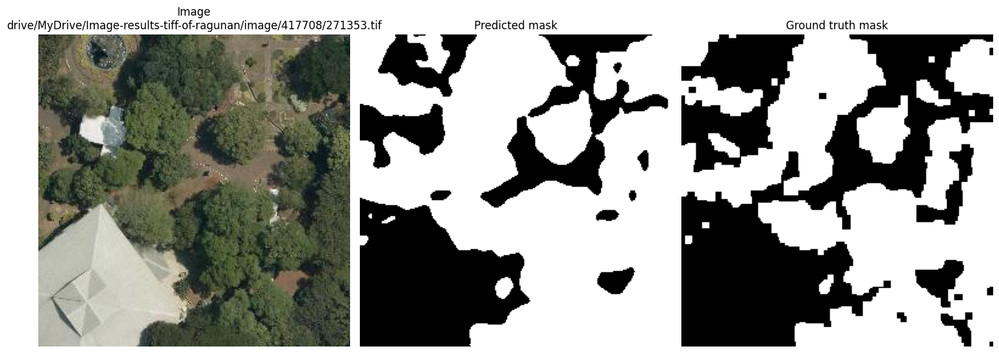

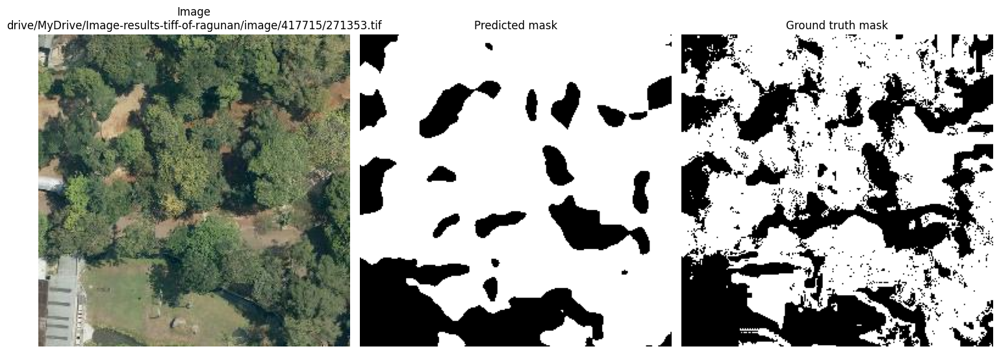

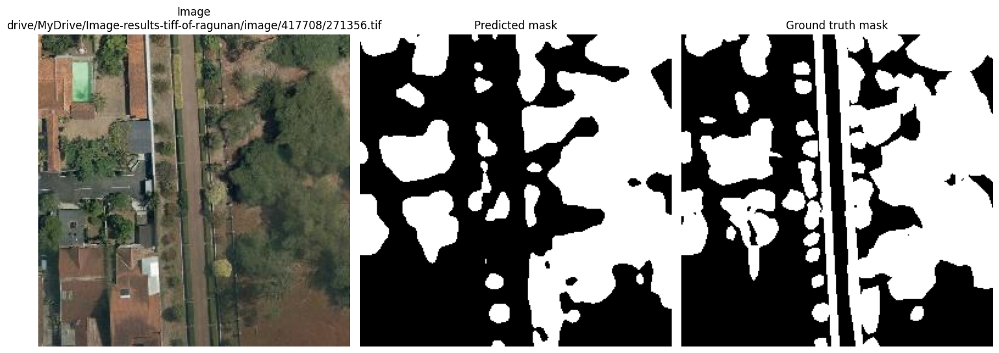

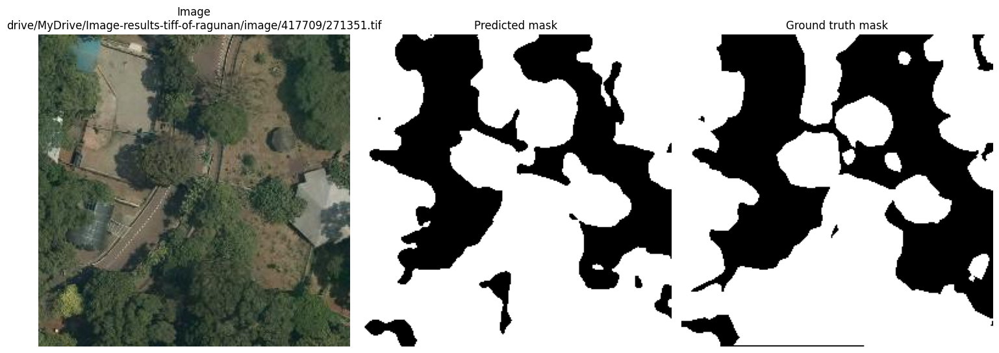

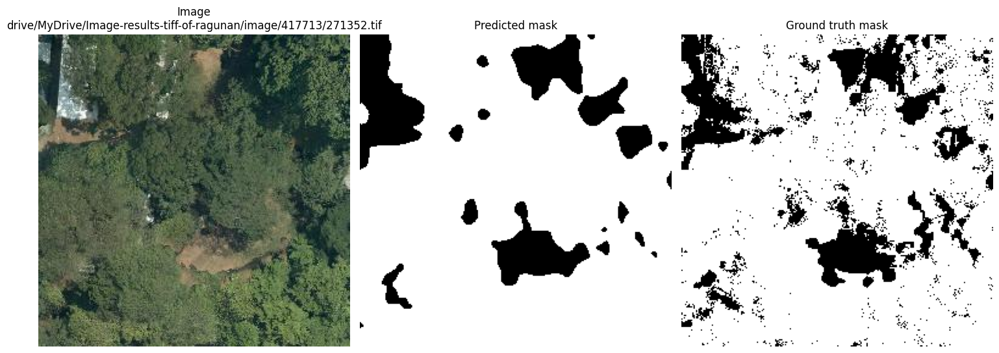

...

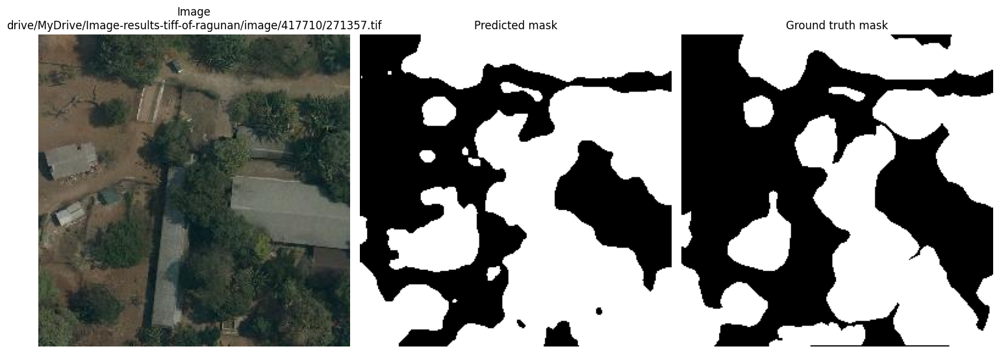

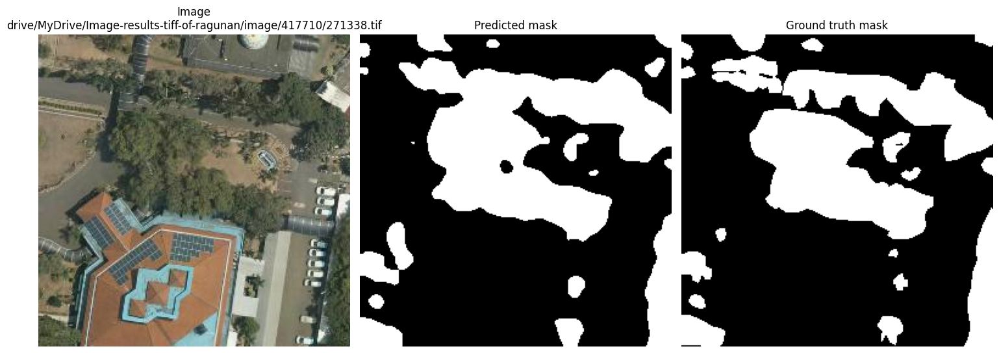

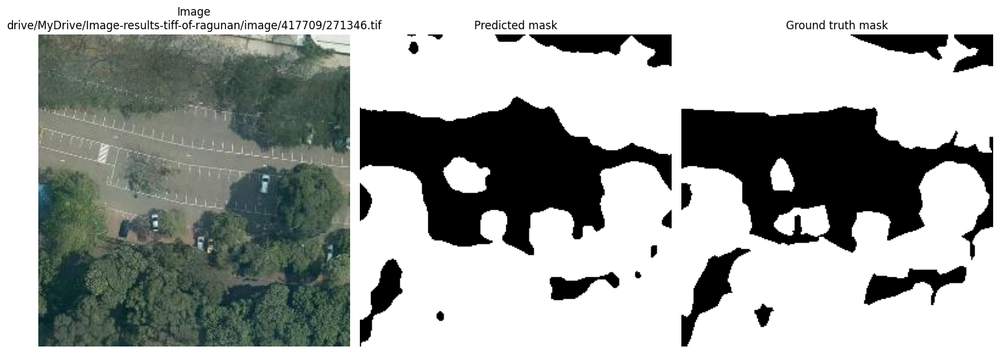

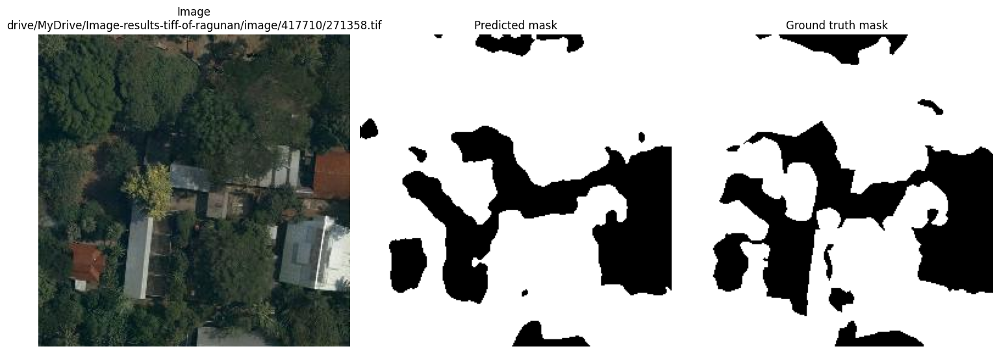

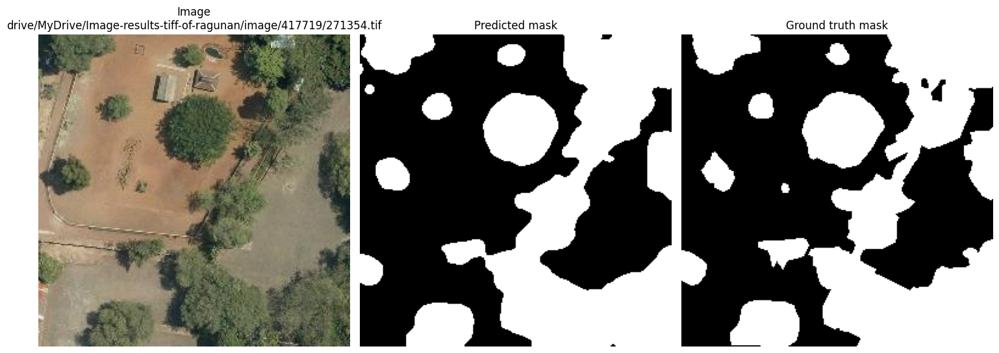

In [45]:
pred_masks = []
gt_masks = []
image_paths = []

with torch.no_grad():
    for image, mask, image_path, mask_path in test_loader:
        image = image.to(device)
        mask = mask.to(device)

        output = fine_tune_model(image)
        output = torch.sigmoid(output)
        pred_mask = (output > 0.5).float()

        for i in range(len(image_path)):
            img = image[i].cpu()
            img_path = image_path[i]

            if img.shape[0] == 1:
                img = img.squeeze(0).numpy()
            elif img.shape[0] == 3:
                img = img.permute(1, 2, 0).numpy()

            gt_mask = mask[i].cpu().squeeze().numpy()
            predicted_mask = pred_mask[i].cpu().squeeze().numpy()

            orig_image = Image.open(img_path).convert("RGB")
            orig_image = np.array(orig_image)

            gt_masks.append(gt_mask)
            pred_masks.append(predicted_mask)
            image_paths.append(img_path)

            plt.figure(figsize = (15, 8))
            plt.subplot(1, 3, 1)
            plt.imshow(orig_image)
            plt.axis("off")
            plt.title(f"Image\n{image_path[i]}")

            plt.subplot(1, 3, 2)
            plt.imshow(predicted_mask, cmap = "gray")
            plt.axis("off")
            plt.title("Predicted mask")

            plt.subplot(1, 3, 3)
            plt.imshow(gt_mask, cmap = "gray")
            plt.axis("off")
            plt.title("Ground truth mask")

            plt.tight_layout()
            plt.show()

In [46]:
def calculate_iou(pred_mask, gt_mask):
    pred_mask_bin = pred_mask > 0
    gt_mask_bin = gt_mask > 0

    intersection = np.logical_and(gt_mask_bin, pred_mask_bin).sum()
    union = np.logical_or(gt_mask_bin, pred_mask_bin).sum()

    if union == 0:
        return 1.0 if intersection == 0 else 0.0

    iou = intersection / union
    return iou

In [47]:
iou_scores = []
total_area = []
images_data = []

for i, img_path in enumerate(image_paths):
    pred_mask = (pred_masks[i] > 0.5).astype(np.uint8)
    gt_mask = (gt_masks[i] > 0.5).astype(np.uint8)

    with rasterio.open(img_path) as src:
        GSD_x, GSD_y = src.res

    pixels = np.sum(pred_mask == 1)
    veg_area = pixels * (GSD_x * GSD_y)
    iou_score = calculate_iou(pred_mask, gt_mask)

    iou_scores.append(iou_score)
    total_area.append(veg_area)

    images_data.append({
        "img_path": img_path,
        "veg_area": veg_area
    })

    print(f"Image {img_path}")
    print(f"GSD x: {GSD_x}")
    print(f"GSD y: {GSD_y}")
    print(f"Pixels: {pixels}")
    print(f"Vegetation coverage area: {veg_area}")
    print(f"IoU score: {iou_score}")
    print("=====================================================")

print("=====================================================")
print(f"Average IoU score: {np.mean(iou_scores)}")
print(f"Total vegetation coverage area: {np.sum(total_area)}")

Image drive/MyDrive/Image-results-tiff-of-ragunan/image/417708/271353.tif
GSD x: 1.9488129761920163
GSD y: 0.2888065298342284
Pixels: 42826
Vegetation coverage area: 24103.753851993744
IoU score: 0.7908419291887371
Image drive/MyDrive/Image-results-tiff-of-ragunan/image/417715/271353.tif
GSD x: 0.29544780320713926
GSD y: 0.263017456683479
Pixels: 48761
Vegetation coverage area: 3789.116364112915
IoU score: 0.7635793593737519
Image drive/MyDrive/Image-results-tiff-of-ragunan/image/417708/271356.tif
GSD x: 1.9488129761920163
GSD y: 0.2888065298342284
Pixels: 28659
Vegetation coverage area: 16130.142475232073
IoU score: 0.7461964239139884
Image drive/MyDrive/Image-results-tiff-of-ragunan/image/417709/271351.tif
GSD x: 1.9488129761920163
GSD y: 0.2888065298342284
Pixels: 43007
Vegetation coverage area: 24205.626066237684
IoU score: 0.8383186041241786
Image drive/MyDrive/Image-results-tiff-of-ragunan/image/417713/271352.tif
GSD x: 0.29544780320713926
GSD y: 0.263017456683479
Pixels: 55193
V

In [50]:
veg_areas = []
carbon_stocks = []

predicted_carbon = 1761.7253514097679

total_veg_area = sum(i["veg_area"] for i in images_data)
carbon_density = predicted_carbon / total_veg_area

for i in images_data:
    carbon_stock = i["veg_area"] * carbon_density
    veg_areas.append(i["veg_area"])
    carbon_stocks.append(carbon_stock)

    print(f"Image {i['img_path']}")
    print(f"Vegetation coverage area: {i['veg_area']} m^2")
    print(f"Carbon density: {carbon_density} ton/m^2")
    print(f"Estimated carbon stock: {carbon_stock} ton")
    print("================================================")

print("================================================")
print(f"Total vegetation coverage area: {total_veg_area} m^2")
print(f"Total carbon density: {carbon_density} ton/m^2")
print(f"Total estimated carbon stock: {sum(carbon_stocks)} ton")

Image drive/MyDrive/Image-results-tiff-of-ragunan/image/417708/271353.tif
Vegetation coverage area: 24103.753851993744 m^2
Carbon density: 0.006835529701554581 ton/m^2
Estimated carbon stock: 164.76192537426388 ton
Image drive/MyDrive/Image-results-tiff-of-ragunan/image/417715/271353.tif
Vegetation coverage area: 3789.116364112915 m^2
Carbon density: 0.006835529701554581 ton/m^2
Estimated carbon stock: 25.900617449540334 ton
Image drive/MyDrive/Image-results-tiff-of-ragunan/image/417708/271356.tif
Vegetation coverage area: 16130.142475232073 m^2
Carbon density: 0.006835529701554581 ton/m^2
Estimated carbon stock: 110.25806797975596 ton
Image drive/MyDrive/Image-results-tiff-of-ragunan/image/417709/271351.tif
Vegetation coverage area: 24205.626066237684 m^2
Carbon density: 0.006835529701554581 ton/m^2
Estimated carbon stock: 165.45827592049147 ton
Image drive/MyDrive/Image-results-tiff-of-ragunan/image/417713/271352.tif
Vegetation coverage area: 4288.93376847243 m^2
Carbon density: 0.00